In [2]:
## Import necessary libraries

import mne
import numpy as np
import matplotlib.pyplot as plt
# import torch
from scipy.io import loadmat
from scipy.special import sph_harm
from numpy.linalg import solve
import json
from scipy.interpolate import RegularGridInterpolator

In [3]:
import numpy as np, matplotlib.pyplot as plt, os
from matplotlib import gridspec
from scipy import ndimage
from ripser import ripser
from persim import plot_diagrams
import gudhi as gd
from sklearn.datasets import load_digits
try:
    from gtda.time_series import TakensEmbedding, SlidingWindow
    from gtda.homology import VietorisRipsPersistence
    from gtda.plotting import plot_diagram
    HAVE_GIOTTO = True
except Exception:
    HAVE_GIOTTO = False

In [37]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import euclidean_distances
import kmapper as km
import networkx as nx
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import DBSCAN, KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors

np.random.seed(42)  # Para reproducibilidad

In [41]:
from IPython.display import HTML, display
import html as _html
from sklearn.metrics.pairwise import euclidean_distances

def compute_eccentricity(X):
    """Calcula la excentricidad para cada punto"""
    distances = euclidean_distances(X, X)
    eccentricity = np.sum(distances, axis=1)
    return eccentricity.reshape(-1, 1)

def visualize_mapper(mapper, graph, title="Mapper Visualization", height=850, color_values=None, color_function_name=None):
  # Get the full HTML as a string (no file needed)
  html_str = mapper.visualize(graph, title=title, save_file=False, color_values=color_values, color_function_name=color_function_name)

  # Escape for attribute context, then embed:
  iframe_html = f'''
              <iframe
                width="100%"
                height="{height}"
                style="border:0; border-radius:8px;"
                sandbox="allow-scripts allow-same-origin"
                srcdoc="{_html.escape(html_str)}">
              </iframe>
              '''
  obj = HTML(iframe_html)
    # Explicitly display so multiple calls in one cell all render
  return obj

# visualize_mapper(mapper, graph, title="Mapper del Circulo", color_values=projection.flatten(), color_function_name="Proyección (x)")

# print("\n✓ Visualización del grafo Mapper generada")

### Actual Try

In [6]:
good = [2, 3, 4, 6, 7, 9, 11, 12, 13, 14, 15, 16, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 30, 31, 33, 34, 36, 38, 40, 41, 42, 44, 45, 46, 48, 49, 50, 51, 52, 53, 54, 56, 57, 58, 59, 60, 65]
good = np.array(good) - 1
subjects = ["01", "02", "04", "09", "15", "37", "79"]
auds = [f"{i:02d}" for i in range(1, 24)]

bad = set(range(65)) - set(good)

san_disk = 'D:/Universidad/2025_2/TDA/data'

In [7]:
import numpy as np
from sklearn.neighbors import NearestNeighbors

def mean_kNN_distances(X, k=5):
    # create the NN model
    nbrs = NearestNeighbors(n_neighbors=k+1, algorithm='auto').fit(X)
    
    # distances: shape (n_samples, k+1)
    # includes distance to itself (0), so we skip it
    distances, indices = nbrs.kneighbors(X)

    # drop the diagonal (distance to self = 0)
    k_distances = distances[:, 1:]

    # compute mean distance of k-NN
    return k_distances.mean(axis=1)

# Example
X = np.random.rand(10000, 50)   # 10k points in 50 dimensions
mean_dist = mean_kNN_distances(X, k=5)


In [8]:
with open(san_disk + '/audios/method_1/fast/ut01_emb3_audio.json', 'r') as file:
        audio_data = json.load(file)
aud = np.array(audio_data)

with open(san_disk + '/eegs/method_2/alpha/fast/bb01_ut01_emb3.json', 'r') as file:
        eeg_data = json.load(file)
eeg = np.array(eeg_data)
eeg = eeg[::int(250/64)]
if eeg.shape[0] > aud.shape[0]:
    eeg = eeg[:aud.shape[0]]
elif eeg.shape[0] < aud.shape[0]:
    aud = aud[:eeg.shape[0]]

eeg.shape, aud.shape

((319, 3, 16, 8), (319, 3))

In [14]:
mean_dist = mean_kNN_distances(aud, k=5)

In [15]:
mean_dist.shape

(319,)

In [16]:
mapper_pca = km.KeplerMapper(verbose=1)

# Usar primera componente de PCA
projection_1d = aud
graph_pca = mapper_pca.map(
    projection_1d,
    y_iris,
    cover=km.Cover(n_cubes=12, perc_overlap=0.5),
    clusterer=DBSCAN(eps=0.5, min_samples=3)
)

pca_obj = visualize_mapper(mapper_pca,
                 graph_pca,
                 title="Mapper: Iris\nFilter: First PCA Component",
                 color_values=y_iris, color_function_name='PCA1')
display(pca_obj)

KeplerMapper(verbose=1)


NameError: name 'y_iris' is not defined

In [17]:
"""
Ball Mapper - Implementación Completa
Métodos de selección de landmarks: random, maxmin, kmeans
"""

import numpy as np
import networkx as nx
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.cluster import KMeans

def ball_mapper(X, epsilon, n_landmarks=20, method='maxmin'):
    """
    Implementación completa de Ball Mapper

    Parámetros:
    -----------
    X : array, shape (n_samples, n_features)
        Datos de entrada
    epsilon : float
        Radio de las bolas
    n_landmarks : int
        Número de landmarks a seleccionar
    method : str
        Método para seleccionar landmarks: 'random', 'maxmin', 'kmeans'

    Retorna:
    --------
    G : networkx.Graph
        Grafo resultante
    landmarks : array
        Puntos landmark seleccionados
    assignments : array booleana
        Matriz (n_samples, n_landmarks) indicando pertenencia a bolas
    coverage : float
        Porcentaje de puntos cubiertos por al menos una bola
    """

    # =========================================================================
    # PASO 1: SELECCIÓN DE LANDMARKS
    # =========================================================================

    if method == 'random':
        # Muestreo aleatorio simple
        idx = np.random.choice(len(X), n_landmarks, replace=False)
        landmarks = X[idx]

    elif method == 'maxmin':
        # MaxMin sampling (Greedy Farthest Point)
        # Selecciona puntos iterativamente maximizando distancia mínima
        landmarks = []

        # Primer landmark: punto aleatorio
        first_idx = np.random.randint(0, len(X))
        landmarks.append(X[first_idx])

        # Distancias mínimas de cada punto a landmarks actuales
        min_distances = np.full(len(X), np.inf)

        for _ in range(n_landmarks - 1):
            # Actualizar distancias mínimas con el último landmark
            last_landmark = landmarks[-1]
            distances_to_last = np.linalg.norm(X - last_landmark, axis=1)
            min_distances = np.minimum(min_distances, distances_to_last)

            # Seleccionar punto más lejano
            farthest_idx = np.argmax(min_distances)
            landmarks.append(X[farthest_idx])

        landmarks = np.array(landmarks)

    elif method == 'kmeans':
        # Usar centroides de K-means como landmarks
        kmeans = KMeans(n_clusters=n_landmarks, random_state=42, n_init=10)
        kmeans.fit(X)
        landmarks = kmeans.cluster_centers_

    else:
        raise ValueError(f"Método '{method}' no reconocido. Use 'random', 'maxmin' o 'kmeans'")

    # =========================================================================
    # PASO 2: CALCULAR ASIGNACIONES A BOLAS
    # =========================================================================

    # Matriz de distancias de puntos a landmarks
    distances = euclidean_distances(X, landmarks)

    # Asignaciones: True si el punto está dentro de la bola del landmark
    assignments = distances <= epsilon

    # =========================================================================
    # PASO 3: CALCULAR COBERTURA
    # =========================================================================

    # Cobertura: porcentaje de puntos en al menos una bola
    covered_points = np.any(assignments, axis=1)
    coverage = np.mean(covered_points)

    # =========================================================================
    # PASO 4: CONSTRUIR GRAFO
    # =========================================================================

    G = nx.Graph()

    # Agregar nodos (uno por landmark con al menos un punto)
    for i in range(n_landmarks):
        points_in_ball = np.sum(assignments[:, i])
        if points_in_ball > 0:
            G.add_node(i, size=int(points_in_ball))

    # Agregar aristas entre landmarks cuyas bolas se intersectan
    for i in range(n_landmarks):
        for j in range(i + 1, n_landmarks):
            # Intersección: puntos que están en ambas bolas
            shared_points = np.sum(assignments[:, i] & assignments[:, j])
            if shared_points > 0:
                G.add_edge(i, j, weight=int(shared_points))

    return G, landmarks, assignments, coverage


# =============================================================================
# FUNCIÓN DE VISUALIZACIÓN
# =============================================================================

def visualize_ball_mapper(X, G, landmarks, assignments, epsilon,
                          title="Ball Mapper", figsize=(14, 6)):
    """
    Visualiza Ball Mapper: datos originales con landmarks y el grafo resultante
    """
    import matplotlib.pyplot as plt

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)

    # Plot 1: Datos originales con landmarks y bolas
    ax1.scatter(X[:, 0], X[:, 1], alpha=0.3, s=20, c='gray', label='Datos')

    # Dibujar círculos (bolas) alrededor de landmarks
    for i, landmark in enumerate(landmarks):
        circle = plt.Circle(landmark, epsilon, fill=False,
                           edgecolor='blue', linestyle='--', alpha=0.3)
        ax1.add_patch(circle)

    # Dibujar landmarks
    ax1.scatter(landmarks[:, 0], landmarks[:, 1],
               c='red', s=200, marker='*', edgecolor='black',
               linewidth=1.5, label='Landmarks', zorder=5)

    ax1.set_title(f"Datos con Landmarks\n(ε={epsilon}, n={len(landmarks)})")
    ax1.legend()
    ax1.axis('equal')
    ax1.grid(True, alpha=0.3)

    # Plot 2: Grafo de Ball Mapper
    pos = nx.spring_layout(G, seed=42, k=1.5)
    node_sizes = [G.nodes[node].get('size', 10) * 20 for node in G.nodes()]

    nx.draw_networkx_nodes(G, pos, ax=ax2,
                          node_size=node_sizes,
                          node_color='lightcoral',
                          alpha=0.8,
                          edgecolors='black',
                          linewidths=1.5)

    nx.draw_networkx_edges(G, pos, ax=ax2,
                          alpha=0.3, width=2, edge_color='gray')

    # Etiquetas de nodos
    nx.draw_networkx_labels(G, pos, ax=ax2, font_size=8)

    ax2.set_title(f"Grafo Ball Mapper\n({G.number_of_nodes()} nodos, "
                 f"{G.number_of_edges()} aristas)")
    ax2.axis('off')

    plt.suptitle(title, fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()


In [18]:
# Generar una serie temporal periódica con ruido
np.random.seed(42)
t = np.linspace(0, 8*np.pi, aud.shape[0])
signal = np.sin(t) + 0.5*np.sin(3*t) + 0.2*np.random.randn(len(t))

plt.figure(figsize=(12, 4))
plt.plot(t, aud[:,8], linewidth=1, alpha=0.7)
plt.title("Serie Temporal: Señal periódica con ruido")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")
plt.grid(True, alpha=0.3)
plt.show()

# Sliding window embedding (Takens)
def sliding_window_embedding(signal, window_size, stride=1):
    """
    Crea embedding de una serie temporal usando ventanas deslizantes
    """
    n_windows = (len(signal) - window_size) // stride + 1
    embedded = np.zeros((n_windows, window_size))

    for i in range(n_windows):
        start = i * stride
        embedded[i] = signal[start:start+window_size]

    return embedded


with open(san_disk + '/audios/method_1/fast/ut01_emb30_audio.json', 'r') as file:
        audio_data = json.load(file)
aud = np.array(audio_data)

with open(san_disk + '/eegs/method_2/alpha/fast/bb37_ut01_emb3.json', 'r') as file:
        eeg_data = json.load(file)
eeg = np.array(eeg_data)
eeg = eeg[::int(250/64)]
if eeg.shape[0] > aud.shape[0]:
    eeg = eeg[:aud.shape[0]]
elif eeg.shape[0] < aud.shape[0]:
    aud = aud[:eeg.shape[0]]

X_embedded = aud

print(f"\n📊 Embedding creado:")
print(f"   Ventanas: {X_embedded.shape[0]}")
print(f"   Dimensión: {X_embedded.shape[1]}")

# Visualizar con PCA
pca_ts = PCA(n_components=5)
X_ts_pca = pca_ts.fit_transform(X_embedded)

fig = plt.figure(figsize=(14, 5))

ax1 = fig.add_subplot(121, projection='3d')
scatter = ax1.scatter(X_ts_pca[:, 0], X_ts_pca[:, 1], X_ts_pca[:, 2],
                     c=range(len(X_ts_pca)), cmap='viridis', s=20, alpha=0.7)
plt.colorbar(scatter, ax=ax1, label='Tiempo', shrink=0.6)
ax1.set_title("Sliding Window Embedding\n(PCA 3D)")
ax1.set_xlabel("PC1")
ax1.set_ylabel("PC2")
ax1.set_zlabel("PC3")

# Aplicar Mapper
mapper_ts = km.KeplerMapper(verbose=1)

# Usar primera componente de PCA como filtro
projection_ts = X_ts_pca[:, 0].reshape(-1, 1)

graph_ts = mapper_ts.map(
    projection_ts,
    X_embedded,
    cover=km.Cover(n_cubes=15, perc_overlap=0.7),
    clusterer=DBSCAN(eps=0.9, min_samples=12)
)

# Crear visualización del grafo
G_ts = nx.Graph()
for node_id, members in graph_ts['nodes'].items():
    G_ts.add_node(node_id, size=len(members))

for node_id, connections in graph_ts['links'].items():
    for target in connections:
        G_ts.add_edge(node_id, target)

ax2 = fig.add_subplot(122)
pos = nx.spring_layout(G_ts, seed=42)
node_sizes = [G_ts.nodes[node].get('size', 10) * 30 for node in G_ts.nodes()]
nx.draw(G_ts, pos, ax=ax2, node_size=node_sizes,
        node_color='lightyellow', with_labels=False,
        edge_color='gray', alpha=0.7, width=2, edgecolors='black')
ax2.set_title(f"Mapper de la Serie Temporal\n"
              f"(estructura periódica revelada)")

plt.tight_layout()
plt.show()


visualize_mapper(mapper=mapper_ts,
                 graph=graph_ts,
                 title="Mapper: Serie Temporal",
                 color_values=projection_ts.flatten(),
                 color_function_name="PCA1")

print("\n✓ El grafo puede revelar periodicidad y patrones en la serie temporal")

IndexError: index 8 is out of bounds for axis 1 with size 3

<Figure size 1200x400 with 0 Axes>

In [19]:
display(mapper_ts)

NameError: name 'mapper_ts' is not defined

## Second attempt

In [20]:
import numpy as np
from scipy.signal import butter, filtfilt
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score, GroupKFold
import networkx as nx
from scipy.linalg import eigvals

# -------------------------
# 1) bandpass filter
def bandpass(signal, fs, low, high, order=4):
    b, a = butter(order, [low/(fs/2), high/(fs/2)], btype='band')
    return filtfilt(b, a, signal)

# -------------------------
# 2) Takens embedding
def takens_embed(x, d, tau=1):
    N = len(x)
    M = N - (d-1)*tau
    if M <= 0:
        raise ValueError("d,tau too large")
    X = np.empty((M, d))
    for i in range(d):
        X[:, i] = x[i*tau : i*tau + M]
    return X

# -------------------------
# 3) PCA dimension selection (same k for all trials)
def choose_pca_k(list_of_embeddings, var_thresh=0.90):
    # list_of_embeddings: list of arrays (n_samples x dim)
    ks = []
    for X in list_of_embeddings:
        pca = PCA()
        pca.fit(X)
        cum = np.cumsum(pca.explained_variance_ratio_)
        k = np.searchsorted(cum, var_thresh) + 1
        ks.append(k)
    return int(np.round(np.mean(ks)))

# -------------------------
# 4) Ball-Mapper-like cover (farthest point sampling centers)
def farthest_point_sampling(X, eps):
    N = X.shape[0]
    centers_idx = [0]
    dists = np.linalg.norm(X - X[0], axis=1)
    while True:
        idx = np.argmax(dists)
        if dists[idx] <= eps:
            break
        centers_idx.append(idx)
        newd = np.linalg.norm(X - X[idx], axis=1)
        dists = np.minimum(dists, newd)
    return np.array(centers_idx)

def build_ball_graph(X, eps, use_fps=True):
    # X: n x dim
    if use_fps:
        centers_idx = farthest_point_sampling(X, eps)
    else:
        centers_idx = np.arange(X.shape[0])  # heavy
    centers = X[centers_idx]
    # assign points to centers: a point p is covered by center c if ||p-c|| <= eps
    nbrs = NearestNeighbors(n_neighbors=1).fit(centers)
    dists, nearest = nbrs.kneighbors(X)
    covered_by = [[] for _ in range(len(centers))]
    for i,p in enumerate(X):
        # allow multiple centers if within eps
        ds = np.linalg.norm(centers - p, axis=1)
        idxs = np.where(ds <= eps)[0]
        if len(idxs)==0:
            # assign nearest
            idxs = [nearest[i,0]]
        for idx in idxs:
            covered_by[idx].append(i)
    # graph: connect centers if they share any covered point
    G = nx.Graph()
    G.add_nodes_from(range(len(centers)))
    for i in range(len(centers)):
        for j in range(i+1, len(centers)):
            # check intersection
            if len(set(covered_by[i]).intersection(covered_by[j]))>0:
                G.add_edge(i,j)
    return G, centers_idx, covered_by

# -------------------------
# 5) Markov matrix from time series assignment
def markov_from_assignments(assignments, n_nodes):
    # assignments: array of node indices for each time step
    C = np.zeros((n_nodes, n_nodes))
    for t in range(len(assignments)-1):
        i = assignments[t]
        j = assignments[t+1]
        C[i,j] += 1
    # row-normalize (add small eps to avoid divide by zero)
    row_sums = C.sum(axis=1, keepdims=True) + 1e-12
    P = C / row_sums
    return P

# assign each time sample to a node (if multiple centers cover a sample, pick nearest)
def assign_samples_to_nodes(X, centers):
    nbrs = NearestNeighbors(n_neighbors=1).fit(centers)
    dists, idxs = nbrs.kneighbors(X)
    return idxs.ravel()

# -------------------------
# 6) spectral distance
def spectral_distance(M1, M2, m_eig=50):
    # compute eigenvalues, sort descending by magnitude
    e1 = np.sort(np.abs(eigvals(M1)))[:m_eig]
    e2 = np.sort(np.abs(eigvals(M2)))[:m_eig]
    # pad if necessary
    L = max(len(e1), len(e2))
    e1 = np.pad(e1, (0, L-len(e1)))
    e2 = np.pad(e2, (0, L-len(e2)))
    return np.linalg.norm(e1 - e2)

# -------------------------
# 7) Full flow for one signal (band, one trial)
def process_signal_single(signal, fs, band, d, tau, pca_k=None, eps=None):
    # band=(low,high)
    sigf = bandpass(signal, fs, band[0], band[1])
    X = takens_embed(sigf, d, tau)
    # PCA: either pass fitted PCA or compute
    if pca_k is None:
        pca = PCA()
        Xp = pca.fit_transform(X)
    else:
        pca = PCA(n_components=pca_k)
        Xp = pca.fit_transform(X)
    # choose eps if None: median 5-NN distance
    if eps is None:
        nbrs = NearestNeighbors(n_neighbors=6).fit(Xp) # includes itself
        dists, _ = nbrs.kneighbors(Xp)
        # distances to 5-NN (skip 0th which is self)
        d5 = dists[:,5]
        eps = np.median(d5)
    G, centers_idx, covered_by = build_ball_graph(Xp, eps)
    centers = Xp[centers_idx]
    assignments = assign_samples_to_nodes(Xp, centers)
    P = markov_from_assignments(assignments, len(centers))
    return {
        'Xp': Xp, 'G': G, 'centers_idx': centers_idx, 'covered_by': covered_by,
        'assignments': assignments, 'P': P, 'eps': eps, 'pca': pca
    }

# -------------------------
# 8) Ejemplo: comparar EEG trial con sus dos audios
# datos: supongamos estructura:
# data[subject][trial] = {'eeg':sig, 'audio_fast':sig, 'audio_slow':sig, 'fs':fs}
# Recolectar M_audio_fast, M_audio_slow, M_eeg y calcular distancias


In [21]:
# features_list: list de vectores, labels: 0=slow,1=fast (o probabilidad)
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GroupKFold
from sklearn.metrics import roc_auc_score

X = np.array(features_list)
y = np.array(labels)
groups = np.array(subject_ids)

clf = RandomForestClassifier(n_estimators=200, random_state=0)
gk = GroupKFold(n_splits=5)
scores = []
for tr_idx, te_idx in gk.split(X, y, groups):
    clf.fit(X[tr_idx], y[tr_idx])
    ypred = clf.predict_proba(X[te_idx])[:,1]
    scores.append(roc_auc_score(y[te_idx], ypred))
print("CV AUC by subject folds:", scores, "mean:", np.mean(scores))


NameError: name 'features_list' is not defined

## Third Attempt: With Rolando

In [22]:
bb = "01"
ut = "01"
speed = "fast"
band = "alpha"
emb = 30
tau = ""

n_phi = 128
n_theta = 64 

# Angular grids (depends on your definition!)
phi = np.linspace(-np.pi, np.pi, n_phi)
theta = np.linspace(0, np.pi, n_theta)

# Target Cartesian grid
N = 50
x = np.linspace(-1, 1, N)
y = np.linspace(-1, 1, N)
X, Y = np.meshgrid(x, y)
R = np.sqrt(X**2 + Y**2)

# Mask for the unit disk
mask = R <= 1

# Map to spherical angles (example: simple azimuthal projection)
phi_map = np.arctan2(Y, X)
theta_map = R * (np.pi / 2)


with open(f'{san_disk}/audios/method_1/{speed}/ut{ut}_emb{emb}{tau}_hilbert.json', 'r') as file:
    aud = json.load(file)
aud = np.array(aud)

interp_maps = np.load(f"{san_disk}/eegs/harmonics/{speed}/{band}/bb{bb}_ut{ut}.npy")
sq_maps = np.zeros((interp_maps.shape[0], N, N))
for t in range(interp_maps.shape[0]):
    img = interp_maps[t, :, :]

    interpolator = RegularGridInterpolator((phi, theta), interp_maps[t], bounds_error=False, fill_value=0)
    pts = np.stack([phi_map[mask], theta_map[mask]], axis=-1)
    vals = interpolator(pts)
    frame = np.zeros((N, N))
    frame[mask] = vals
    sq_maps[t, :, :] = frame


In [23]:
aud.shape

(931, 30)

In [24]:
sq_maps.shape

(960, 50, 50)

In [40]:
"""
Ball Mapper - Implementación Completa
Métodos de selección de landmarks: random, maxmin, kmeans
"""

import numpy as np
import networkx as nx
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.cluster import KMeans

def ball_mapper(X, epsilon, n_landmarks=20, method='maxmin'):
    """
    Implementación completa de Ball Mapper

    Parámetros:
    -----------
    X : array, shape (n_samples, n_features)
        Datos de entrada
    epsilon : float
        Radio de las bolas
    n_landmarks : int
        Número de landmarks a seleccionar
    method : str
        Método para seleccionar landmarks: 'random', 'maxmin', 'kmeans'

    Retorna:
    --------
    G : networkx.Graph
        Grafo resultante
    landmarks : array
        Puntos landmark seleccionados
    assignments : array booleana
        Matriz (n_samples, n_landmarks) indicando pertenencia a bolas
    coverage : float
        Porcentaje de puntos cubiertos por al menos una bola
    """

    # =========================================================================
    # PASO 1: SELECCIÓN DE LANDMARKS
    # =========================================================================

    if method == 'random':
        # Muestreo aleatorio simple
        idx = np.random.choice(len(X), n_landmarks, replace=False)
        landmarks = X[idx]

    elif method == 'maxmin':
        # MaxMin sampling (Greedy Farthest Point)
        # Selecciona puntos iterativamente maximizando distancia mínima
        landmarks = []

        # Primer landmark: punto aleatorio
        first_idx = np.random.randint(0, len(X))
        landmarks.append(X[first_idx])

        # Distancias mínimas de cada punto a landmarks actuales
        min_distances = np.full(len(X), np.inf)

        for _ in range(n_landmarks - 1):
            # Actualizar distancias mínimas con el último landmark
            last_landmark = landmarks[-1]
            distances_to_last = np.linalg.norm(X - last_landmark, axis=1)
            min_distances = np.minimum(min_distances, distances_to_last)

            # Seleccionar punto más lejano
            farthest_idx = np.argmax(min_distances)
            landmarks.append(X[farthest_idx])

        landmarks = np.array(landmarks)

    elif method == 'kmeans':
        # Usar centroides de K-means como landmarks
        kmeans = KMeans(n_clusters=n_landmarks, random_state=42, n_init=10)
        kmeans.fit(X)
        landmarks = kmeans.cluster_centers_

    else:
        raise ValueError(f"Método '{method}' no reconocido. Use 'random', 'maxmin' o 'kmeans'")

    # =========================================================================
    # PASO 2: CALCULAR ASIGNACIONES A BOLAS
    # =========================================================================

    # Matriz de distancias de puntos a landmarks
    distances = euclidean_distances(X, landmarks)

    # Asignaciones: True si el punto está dentro de la bola del landmark
    assignments = distances <= epsilon

    # =========================================================================
    # PASO 3: CALCULAR COBERTURA
    # =========================================================================

    # Cobertura: porcentaje de puntos en al menos una bola
    covered_points = np.any(assignments, axis=1)
    coverage = np.mean(covered_points)

    # =========================================================================
    # PASO 4: CONSTRUIR GRAFO
    # =========================================================================

    G = nx.Graph()

    # Agregar nodos (uno por landmark con al menos un punto)
    for i in range(n_landmarks):
        points_in_ball = np.sum(assignments[:, i])
        if points_in_ball > 0:
            G.add_node(i, size=int(points_in_ball))

    # Agregar aristas entre landmarks cuyas bolas se intersectan
    for i in range(n_landmarks):
        for j in range(i + 1, n_landmarks):
            # Intersección: puntos que están en ambas bolas
            shared_points = np.sum(assignments[:, i] & assignments[:, j])
            if shared_points > 0:
                G.add_edge(i, j, weight=int(shared_points))

    return G, landmarks, assignments, coverage


# =============================================================================
# FUNCIÓN DE VISUALIZACIÓN
# =============================================================================

def visualize_ball_mapper(X, G, landmarks, assignments, epsilon,
                          title="Ball Mapper", figsize=(14, 6)):
    """
    Visualiza Ball Mapper: datos originales con landmarks y el grafo resultante
    """
    import matplotlib.pyplot as plt

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)

    # Plot 1: Datos originales con landmarks y bolas
    ax1.scatter(X[:, 0], X[:, 1], alpha=0.3, s=20, c='gray', label='Datos')

    # Dibujar círculos (bolas) alrededor de landmarks
    for i, landmark in enumerate(landmarks):
        circle = plt.Circle(landmark, epsilon, fill=False,
                           edgecolor='blue', linestyle='--', alpha=0.3)
        ax1.add_patch(circle)

    # Dibujar landmarks
    ax1.scatter(landmarks[:, 0], landmarks[:, 1],
               c='red', s=200, marker='*', edgecolor='black',
               linewidth=1.5, label='Landmarks', zorder=5)

    ax1.set_title(f"Datos con Landmarks\n(ε={epsilon}, n={len(landmarks)})")
    ax1.legend()
    ax1.axis('equal')
    ax1.grid(True, alpha=0.3)

    # Plot 2: Grafo de Ball Mapper
    pos = nx.spring_layout(G, seed=42, k=1.5)
    node_sizes = [G.nodes[node].get('size', 10) * 20 for node in G.nodes()]

    nx.draw_networkx_nodes(G, pos, ax=ax2,
                          node_size=node_sizes,
                          node_color='lightcoral',
                          alpha=0.8,
                          edgecolors='black',
                          linewidths=1.5)

    nx.draw_networkx_edges(G, pos, ax=ax2,
                          alpha=0.3, width=2, edge_color='gray')

    # Etiquetas de nodos
    nx.draw_networkx_labels(G, pos, ax=ax2, font_size=8)

    ax2.set_title(f"Grafo Ball Mapper\n({G.number_of_nodes()} nodos, "
                 f"{G.number_of_edges()} aristas)")
    ax2.axis('off')

    plt.suptitle(title, fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()


## Audio

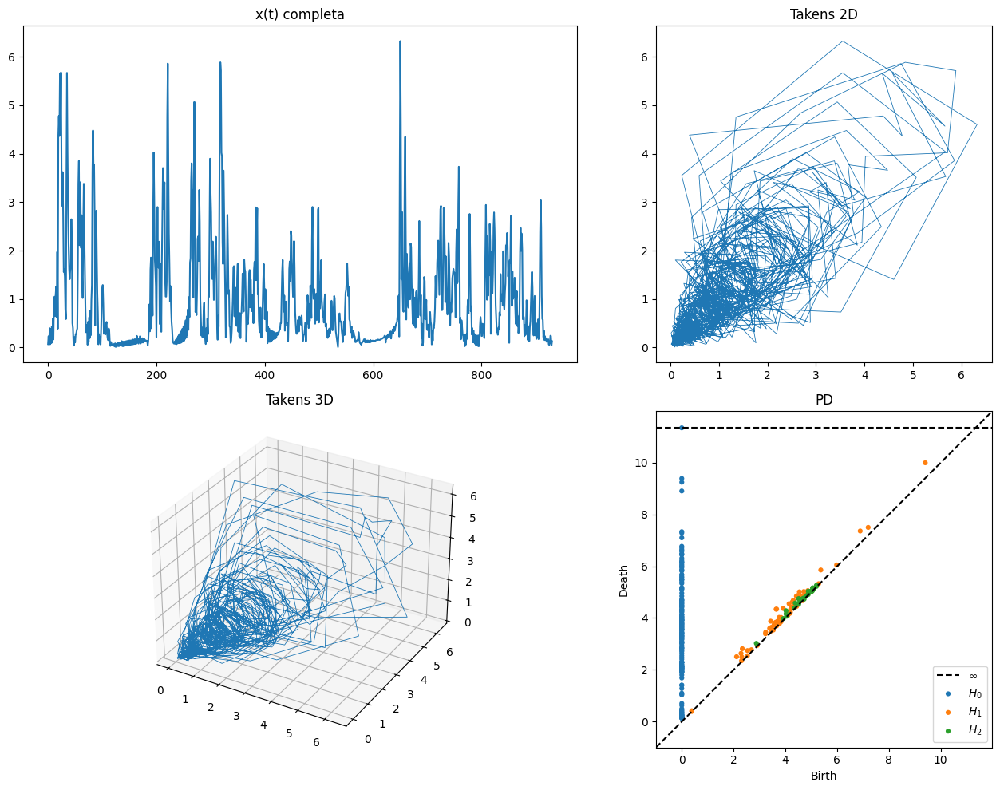

In [26]:
t = aud.shape[0]
x_series = aud[:,0]  
emb2 = aud[:, :2]
emb3 = aud[:, :3]

fig = plt.figure(figsize=(14,10))
ax = fig.add_subplot(221); ax.plot(x_series); ax.set_title("x(t) completa")
ax = fig.add_subplot(222); ax.plot(emb2[:,0], emb2[:,1], lw=0.6); ax.set_title("Takens 2D"); ax.set_aspect('equal')
ax = fig.add_subplot(223, projection='3d'); ax.plot(emb3[:,0], emb3[:,1], emb3[:,2], lw=0.6); ax.set_title("Takens 3D")

# Persistencia (submuestreo para rapidez)
idx = np.arange(0, len(aud), 5)
D_emb = ripser(aud[idx], maxdim=2)['dgms']
ax = fig.add_subplot(224); plot_diagrams(D_emb, ax=ax, show=False); ax.set_title("PD"); plt.tight_layout(); plt.show()

#### Ball Mapper

In [27]:
pca = PCA(n_components=2)
X_pca = pca.fit_transform(aud)

print("Explained variance:", pca.explained_variance_ratio_)
print("Projected data shape:", X_pca.shape)
print(pca.explained_variance_ratio_.cumsum())

Explained variance: [0.31792296 0.15406354]
Projected data shape: (931, 2)
[0.31792296 0.4719865 ]


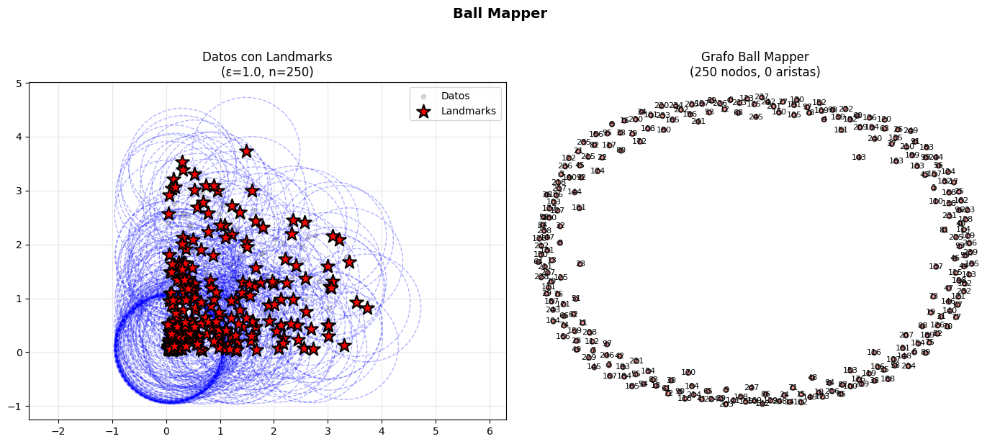

In [33]:
eps = 1.0
G, landmarks, assignments, coverage = ball_mapper(aud, epsilon=eps, n_landmarks=250, method='maxmin')
visualize_ball_mapper(aud, G, landmarks, assignments, epsilon=eps)

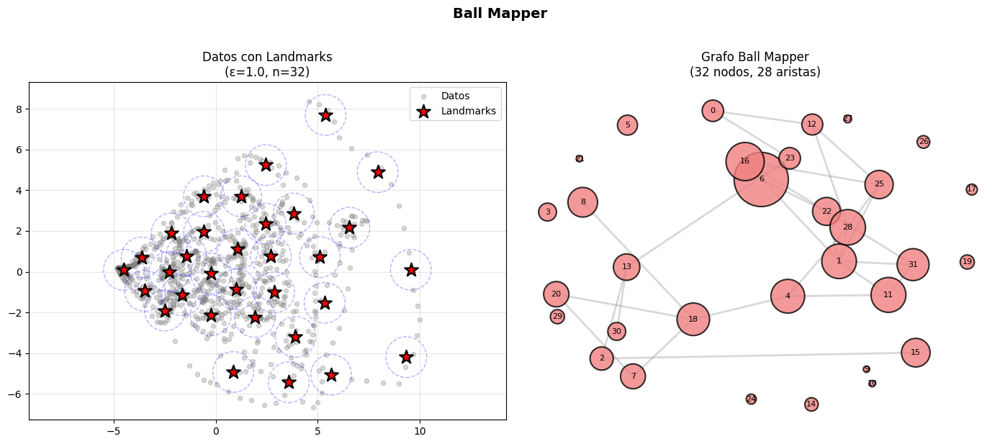

In [34]:
eps = 1.0
G, landmarks, assignments, coverage = ball_mapper(X_pca, epsilon=eps, n_landmarks=32, method='kmeans')
visualize_ball_mapper(X_pca, G, landmarks, assignments, epsilon=eps)

#### Classic Mapper

In [28]:
import warnings
with warnings.catch_warnings():
    warnings.filterwarnings("ignore")

    count = 0
    for tau in ["", "_tau10"]:
        for emb in [30, 50, 64]:
            for speed in ["slow", "fast"]:
                for band in ["theta", "alpha", "beta"]:
                    for m in range(1, len(subjects)):
                        for n in range(len(auds)):
                            count += 1
                            if count < 23:
                                continue
                            bb = subjects[m]
                            ut = auds[n]
n_phi = 128
n_theta = 64 

# Angular grids (depends on your definition!)
phi = np.linspace(-np.pi, np.pi, n_phi)
theta = np.linspace(0, np.pi, n_theta)

# Target Cartesian grid
N = 50
x = np.linspace(-1, 1, N)
y = np.linspace(-1, 1, N)
X, Y = np.meshgrid(x, y)
R = np.sqrt(X**2 + Y**2)

# Mask for the unit disk
mask = R <= 1

# Map to spherical angles (example: simple azimuthal projection)
phi_map = np.arctan2(Y, X)
theta_map = R * (np.pi / 2)


with open(f'{san_disk}/audios/method_1/{speed}/ut{ut}_emb{emb}{tau}_hilbert.json', 'r') as file:
    aud = json.load(file)
aud = np.array(aud)

interp_maps = np.load(f"{san_disk}/eegs/harmonics/{speed}/{band}/bb{bb}_ut{ut}.npy")
sq_maps = np.zeros((interp_maps.shape[0], N, N))
for t in range(interp_maps.shape[0]):
    img = interp_maps[t, :, :]

    interpolator = RegularGridInterpolator((phi, theta), interp_maps[t], bounds_error=False, fill_value=0)
    pts = np.stack([phi_map[mask], theta_map[mask]], axis=-1)
    vals = interpolator(pts)
    frame = np.zeros((N, N))
    frame[mask] = vals
    sq_maps[t, :, :] = frame

In [38]:
import sklearn
mapper_pca = km.KeplerMapper(verbose=1)

# Usar primera componente de PCA
pca = PCA(n_components=2)
data = aud

data = mapper_pca.fit_transform(data, projection=sklearn.manifold.TSNE())
# data = pca.fit_transform(data)
data = data[:, 0]  # Usar primeras 2 componentes para visualización
graph_pca = mapper_pca.map(
    data,
    # np.random.rand(data.shape[0]),  # Usar datos originales para clustering
    cover=km.Cover(n_cubes=12, perc_overlap=0.5),
    clusterer=DBSCAN(eps=0.5, min_samples=3)
)

pca_obj = visualize_mapper(mapper_pca,
                 graph_pca,
                 title="Mapper: Iris\nFilter: First PCA Component")
pca_obj

KeplerMapper(verbose=1)
..Composing projection pipeline of length 1:
	Projections: TSNE()
	Distance matrices: False
	Scalers: MinMaxScaler()
..Projecting on data shaped (445, 64)

..Projecting data using: 
	TSNE(verbose=1)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 445 samples in 0.000s...
[t-SNE] Computed neighbors for 445 samples in 0.011s...
[t-SNE] Computed conditional probabilities for sample 445 / 445
[t-SNE] Mean sigma: 4.259008
[t-SNE] KL divergence after 250 iterations with early exaggeration: 60.045773
[t-SNE] KL divergence after 1000 iterations: 0.686687

..Scaling with: MinMaxScaler()

Mapping on data shaped (445,) using lens shaped (445,)

Creating 12 hypercubes.

Created 11 edges and 12 nodes in 0:00:00.008999.


## EEG Square

In [11]:
for t in range(len(sq_maps)):
    frame = sq_maps[t]
    masked = np.ma.masked_where(frame == 0, frame)

    cmap = plt.cm.viridis.copy()
    cmap.set_bad('white')   # masked values (zeros) will be white

    fig = plt.figure()
    plt.imshow(masked, cmap=cmap, vmin=-0.4, vmax=0.4)
    plt.colorbar()
    plt.title(f"Spherical Interpolation Projected into the Unit Sphere\nBB{bb} UT{ut} Speed: {speed} Band: {band}")
    plt.savefig("imgs/" + str(t) + ".png")
    plt.close()

NameError: name 'sq_maps' is not defined

In [12]:
import imageio

images = []
for i in range(len(sq_maps)):
    filename = f"imgs/{i}.png"
    images.append(imageio.imread(filename))
    

imageio.mimsave("animation_rolando.gif", images, fps=64)

NameError: name 'sq_maps' is not defined

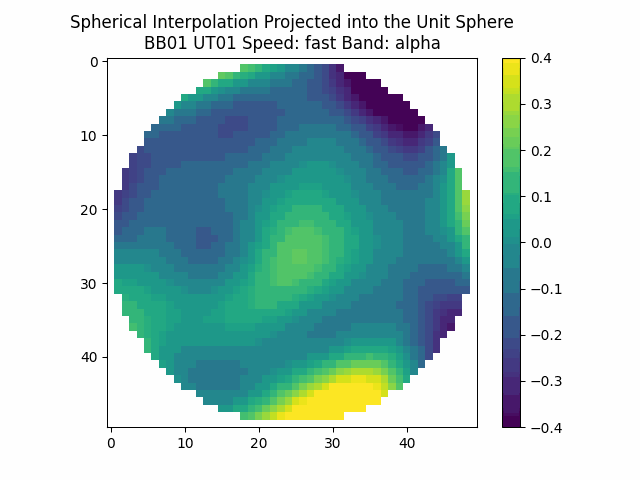

In [30]:
from IPython.display import Image

Image(filename="animation_rolando.gif")